# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [1]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)



5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

In [2]:
def plot_three(img1, img2, img3, titles=['Original', 'Filtered', 'Difference']):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(131)
    plt.imshow(img1, cmap='gray')
    plt.title(titles[0])
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(img2, cmap='gray')
    plt.title(titles[1])
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(img3, cmap='gray')
    plt.title(titles[2])
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [3]:
def conv_filter(img, kernel):
    kernel = kernel.astype(np.float64) 
    kernel /= (abs(kernel)).sum()

    filtered_img = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE)

    return filtered_img

In [4]:
def test_kernel(img_path, kernel):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    filtered_img =  conv_filter(img, kernel)
    diff_img = np.abs(img - filtered_img)

    plot_three(img, filtered_img, diff_img)

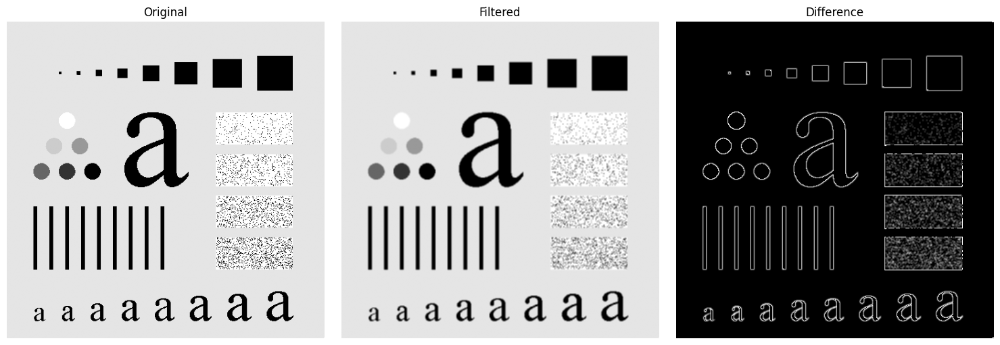

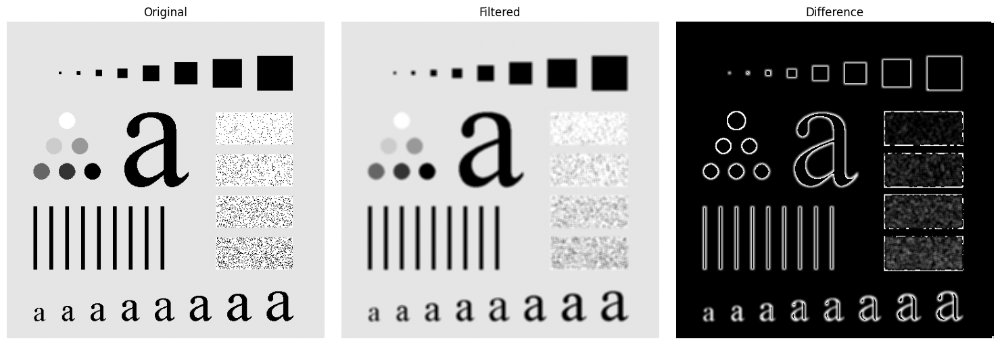

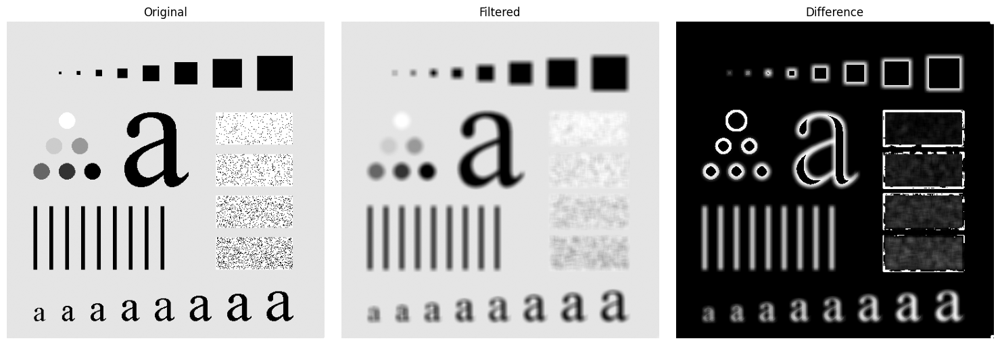

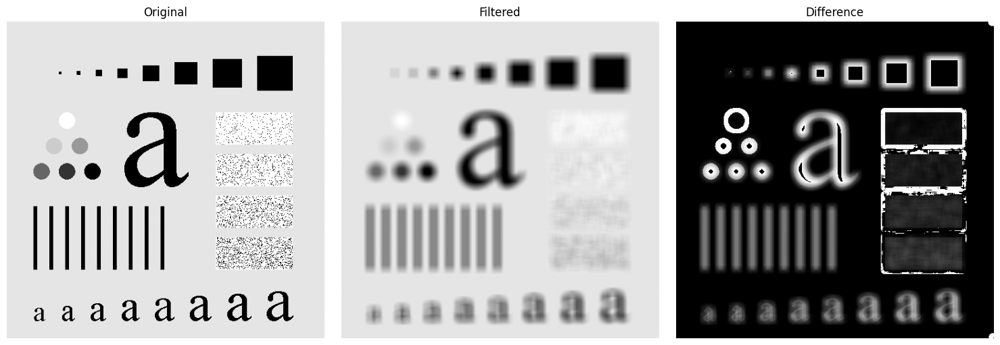

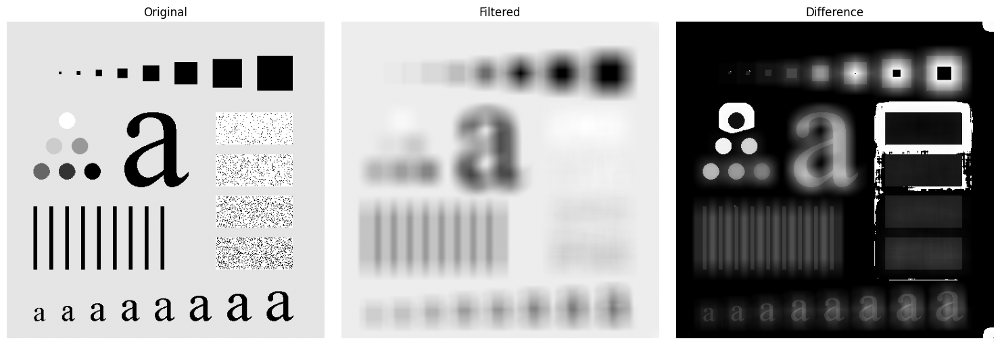

In [5]:
kernel = np.ones((3,3))

test_kernel("plansza.png", kernel)

kernel = np.ones((5,5))

test_kernel("plansza.png", kernel)

kernel = np.ones((9,9))

test_kernel("plansza.png", kernel)

kernel = np.ones((15,15))

test_kernel("plansza.png", kernel)

kernel = np.ones((35,35))

test_kernel("plansza.png", kernel)

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

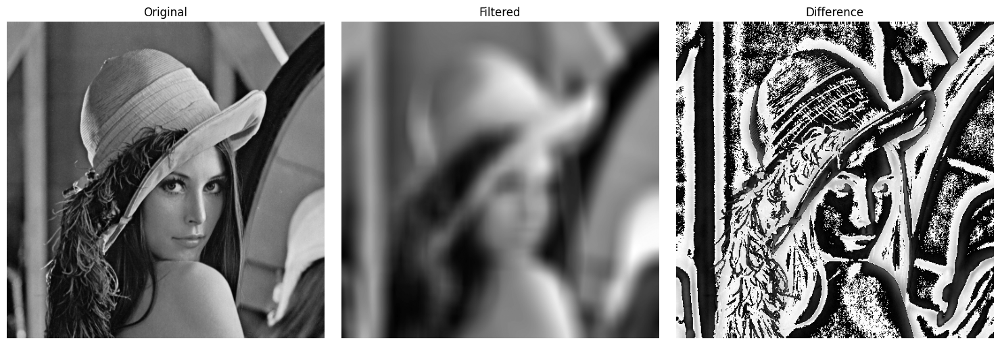

In [6]:
test_kernel("lena.png", kernel)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

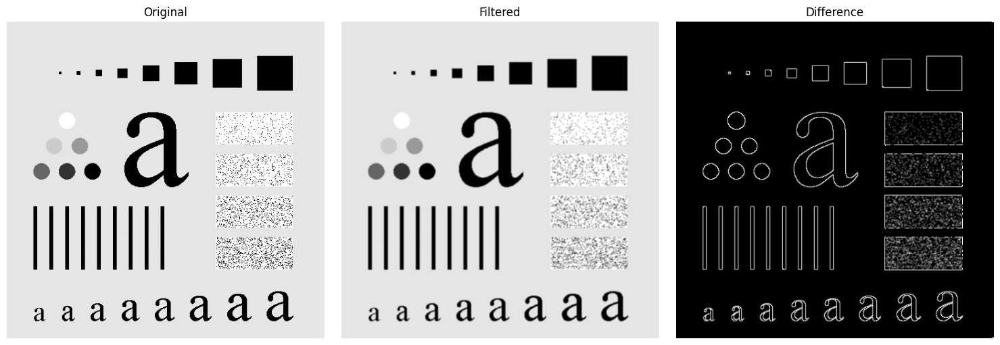

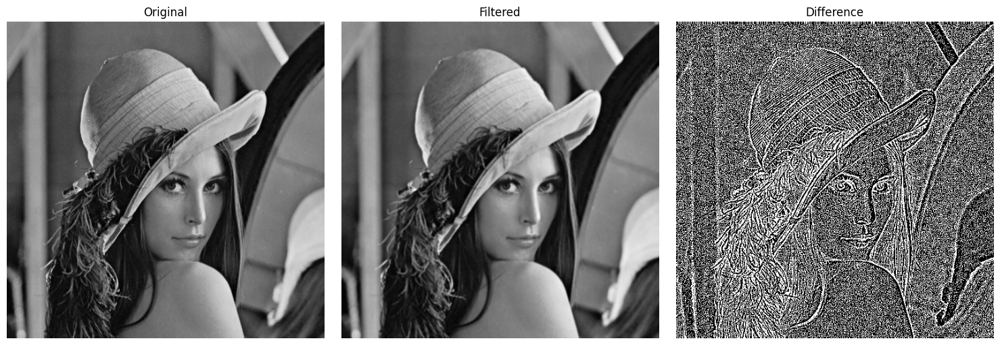

In [7]:
sharp_kernel = np.array([[1.0, 2.0, 1.0],[2.0, 4.0, 2.0],[1.0, 2.0, 1.0]])

test_kernel("plansza.png", sharp_kernel)
test_kernel("lena.png", sharp_kernel)

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


In [8]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g
    
    
def mesh(fun, size):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    X = np.arange(-size/2, size/2, 1)
    Y = np.arange(-size/2, size/2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    ax.plot_surface(X, Y, Z, cmap='viridis')
    plt.show()

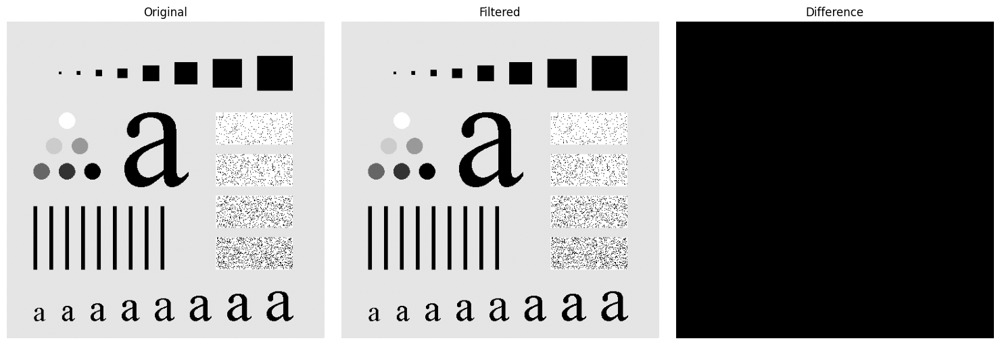

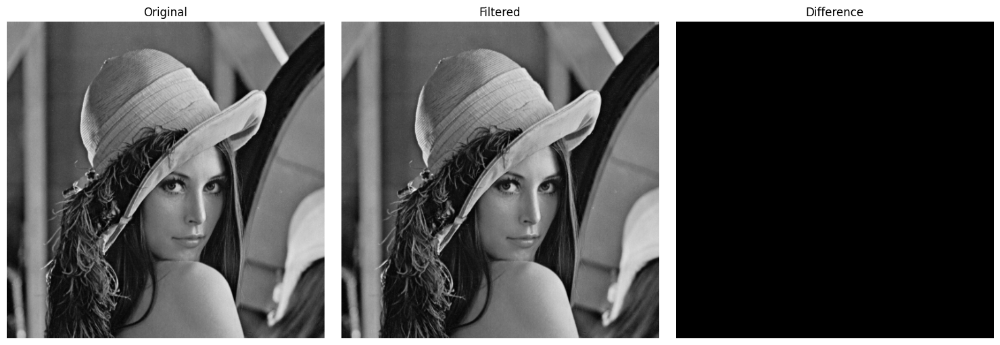

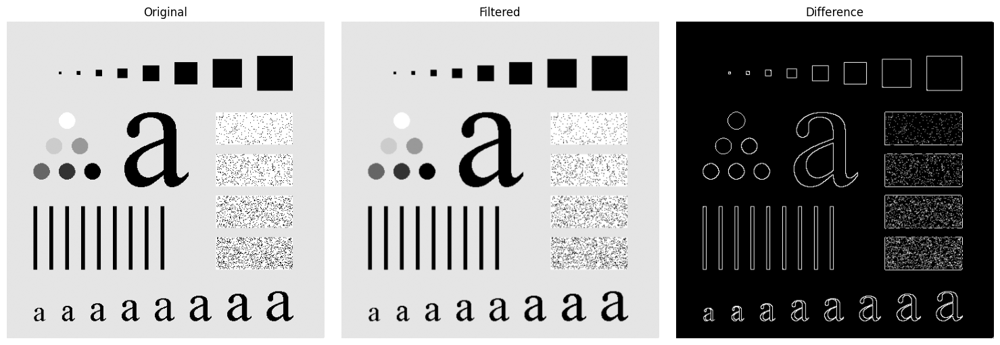

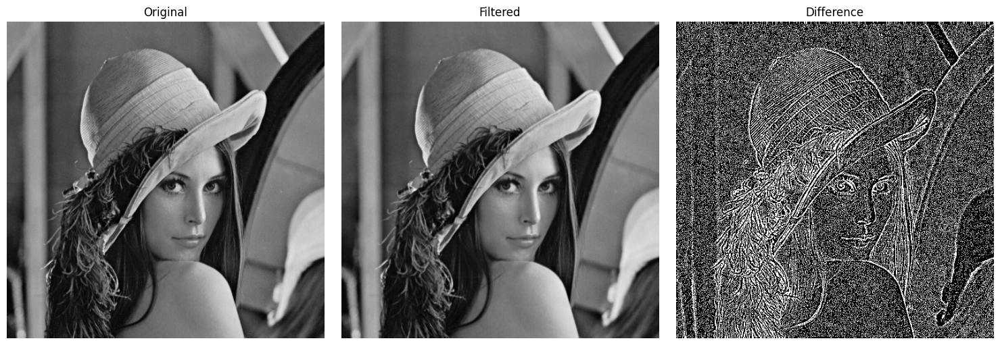

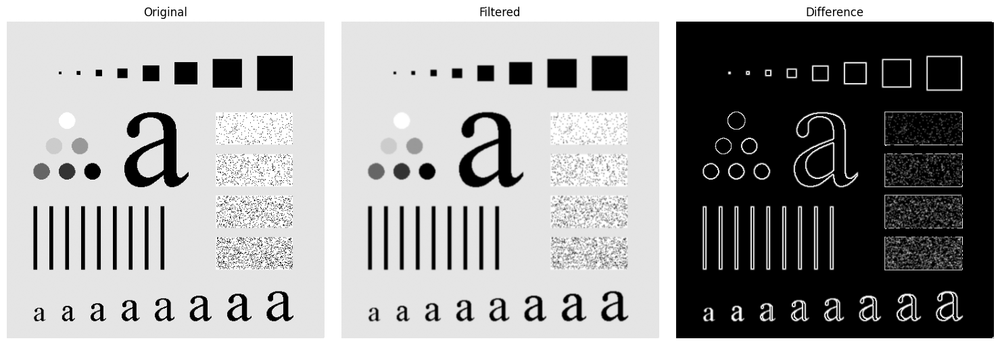

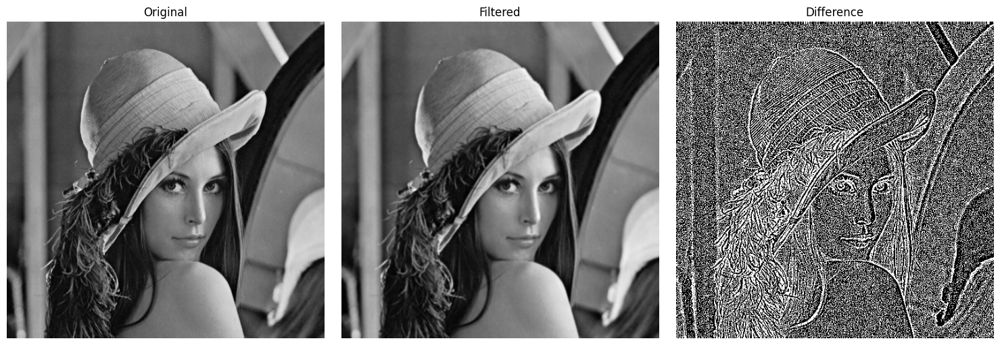

In [9]:
for size, sigma in [(5, 0.25), (5, 0.5), (5, 0.75)]:
    for img_path in ["plansza.png", "lena.png"]:
        gaussian_kernel = fgaussian(size, sigma)
        test_kernel(img_path, gaussian_kernel)

In [10]:
def plot_two(img1, img2, titles=['Own Implementation', 'OpenCV Implementation']):
   plt.figure(figsize=(10, 5))
   plt.subplot(121)
   plt.imshow(img1, cmap='gray')
   plt.title(titles[0])
   plt.axis('off')
   
   plt.subplot(122)
   plt.imshow(img2, cmap='gray')
   plt.title(titles[1])
   plt.axis('off')
   
   plt.tight_layout()
   plt.show()

In [11]:
def compare_gaussian_blurs(img_path, kernel_size=5, sigma=0.5):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
   
   kernel = fgaussian(kernel_size, sigma)
   own_blur = conv_filter(img, kernel)
   
   cv_blur = cv2.GaussianBlur(img, (kernel_size,kernel_size), sigma, borderType=cv2.BORDER_REPLICATE)
   
   plot_two(own_blur, cv_blur)

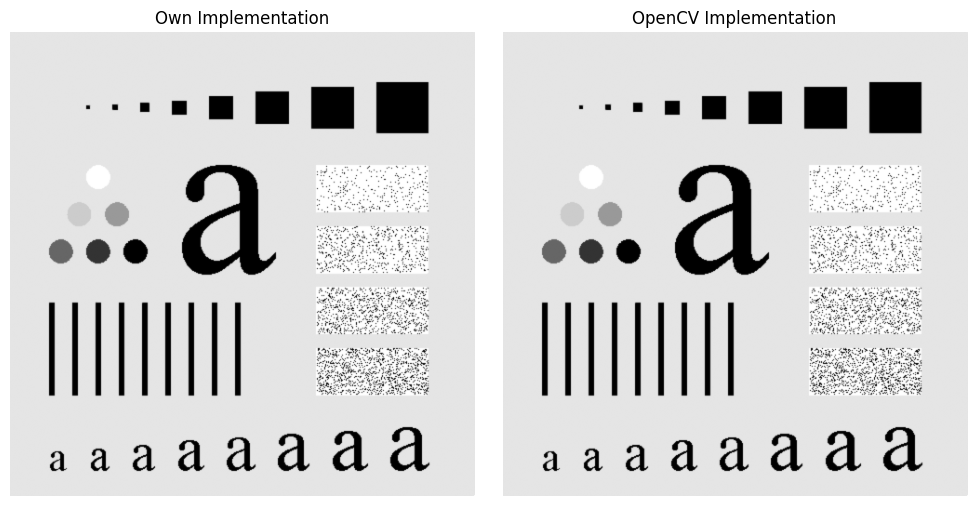

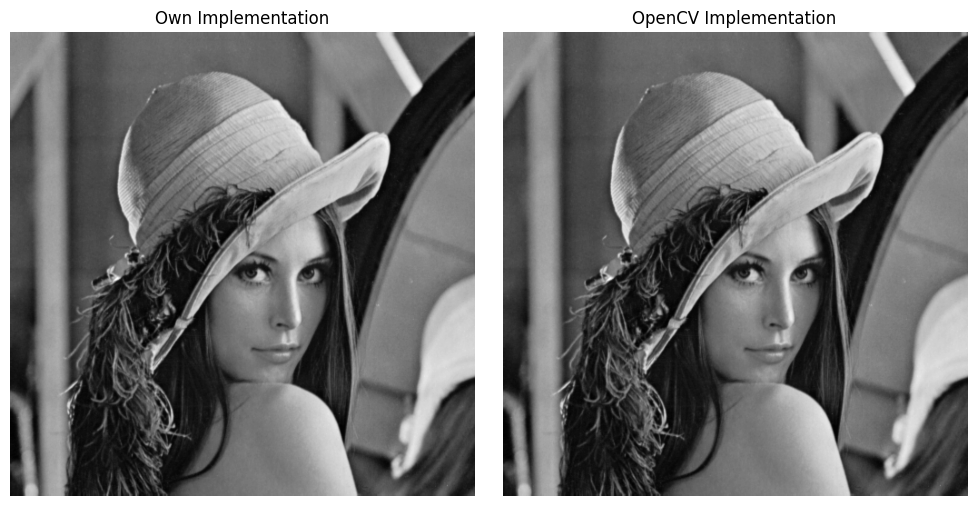

In [12]:
compare_gaussian_blurs("plansza.png")
compare_gaussian_blurs("lena.png")

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


In [13]:
def compare_mean_median(img_path, kernel_size=3):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
   
   kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
   mean_filtered = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE)
   mean_diff = np.abs(img - mean_filtered)
   
   median_filtered = cv2.medianBlur(img, kernel_size)
   median_diff = np.abs(img - median_filtered)
   
   plot_three(img, mean_filtered, mean_diff)
   plot_three(img, median_filtered, median_diff)

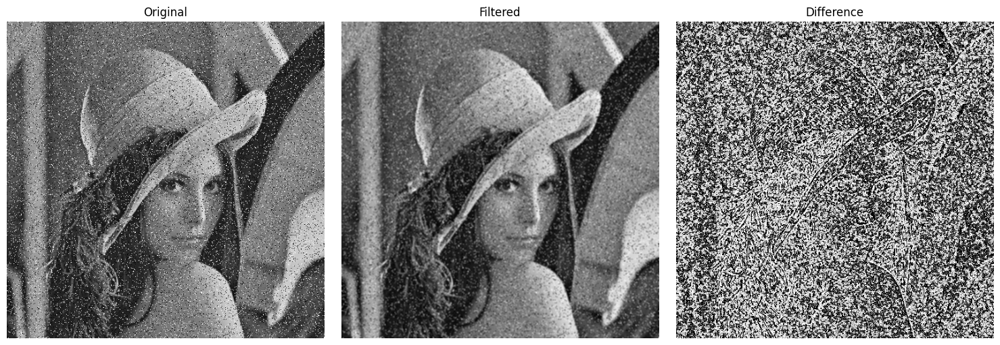

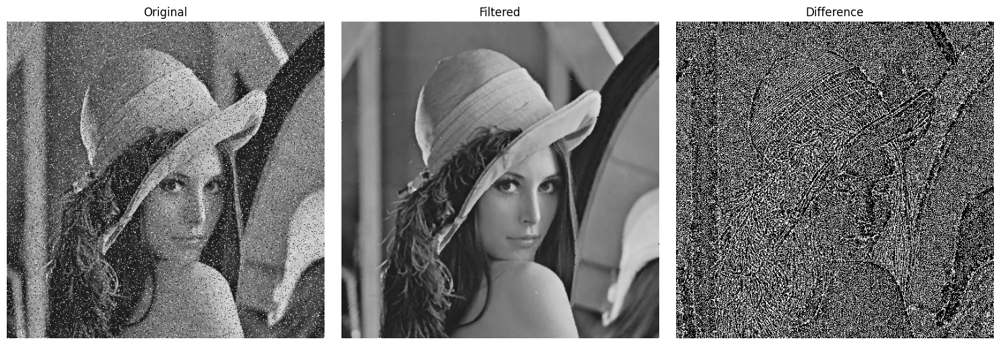

In [14]:
compare_mean_median("lenaSzum.png")

2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

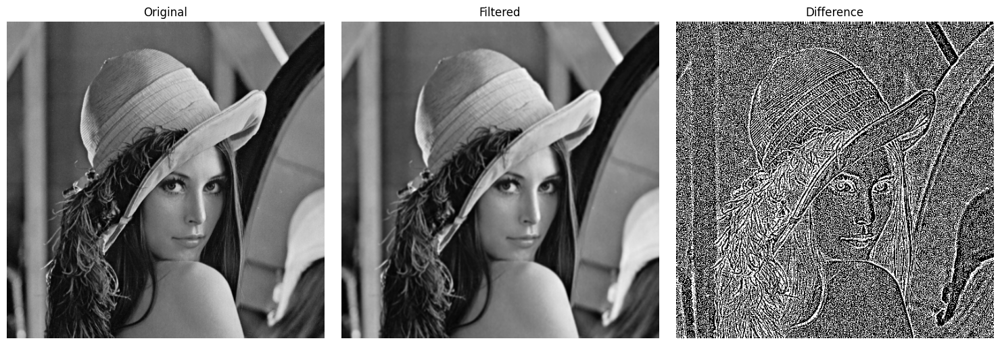

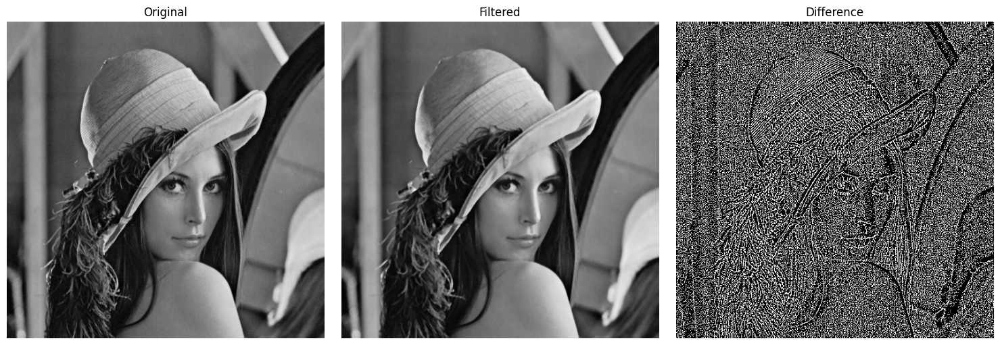

In [15]:
compare_mean_median("lena.png")

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

In [16]:
def multiple_median(img_path, kernel_size=5, iterations=10):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
   result = img.copy()
   
   for i in range(iterations):
       result = cv2.medianBlur(result, kernel_size)
       
   diff = np.abs(img - result)
   plot_three(img, result, diff)

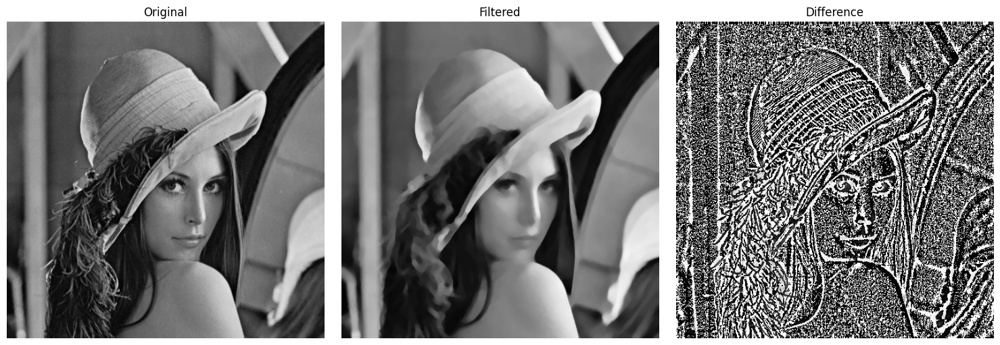

In [17]:
multiple_median("lena.png")

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

In [18]:
def laplacian_filter(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    kernel = np.array([[0.0, 1, 0],
                      [1, -4, 1],
                      [0, 1, 0]])
                      
    filtered = conv_filter(img, kernel)
    scaled = filtered + 128
    absolute = np.abs(filtered)
    
    plot_three(img, scaled, absolute, 
              titles=['Original', 'Scaled', 'ScaledAbs'])

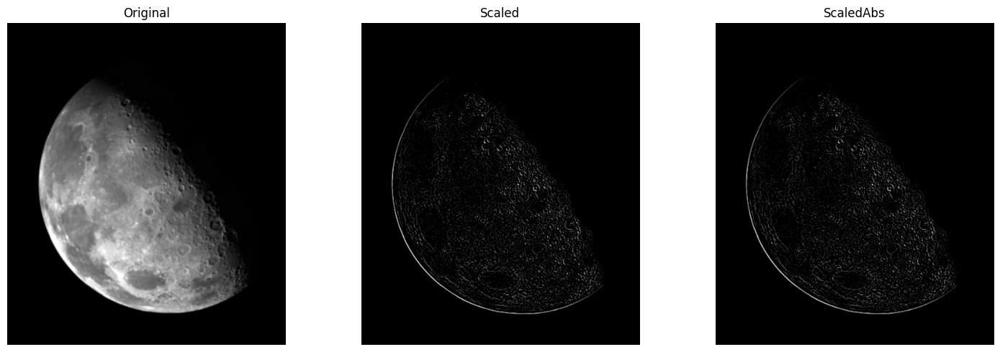

In [19]:
laplacian_filter("moon.png")

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



In [20]:
def laplacian_sharpening(img_path):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.float64)
   
   kernel = np.array([[0.0, 1, 0],
                     [1, -4, 1],
                     [0, 1, 0]])
                     
   filtered = conv_filter(img, kernel)
   sharpened = img + filtered
   diff = np.abs(img - sharpened)
   
   plot_three(img, img + filtered, img - filtered,
             titles=['Original', 'Sum', 'Difference'])

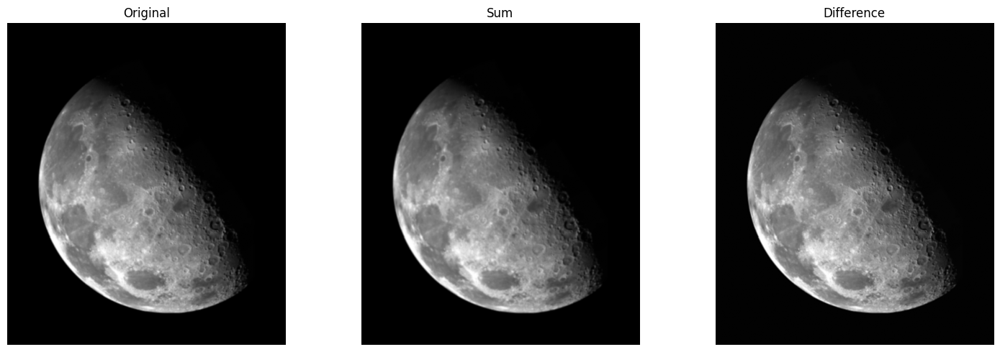

In [21]:
laplacian_sharpening("moon.png")

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

In [22]:
def edge_detection(img_path, kernel1, kernel2, title):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.float64)
   
   grad1 = conv_filter(img, kernel1)
   grad2 = conv_filter(img, kernel2)
   
   magnitude = np.sqrt(grad1**2 + grad2**2)
   
   plot_three(img, magnitude, np.abs(grad1 - grad2),
             titles=['Original', 'Magnitude', 'Difference'])

In [23]:
def detect_all_edges(img_path):
   R1 = np.array([[0.0, 0, 0],
                  [-1, 0, 0],
                  [0, 1, 0]])
   R2 = np.array([[0.0, 0, 0],
                  [0, 0, -1],
                  [0, 1, 0]])
   edge_detection(img_path, R1, R2, 'Roberts')
   
   P1 = np.array([[-1.0, 0, 1],
                  [-1, 0, 1],
                  [-1, 0, 1]])
   P2 = np.array([[-1.0, -1, -1],
                  [0, 0, 0],
                  [1, 1, 1]])
   edge_detection(img_path, P1, P2, 'Prewitt')
   
   S1 = np.array([[-1.0, 0, 1],
                  [-2, 0, 2],
                  [-1, 0, 1]])
   S2 = np.array([[-1.0, -2, -1],
                  [0, 0, 0],
                  [1, 2, 1]])
   edge_detection(img_path, S1, S2, 'Sobel')

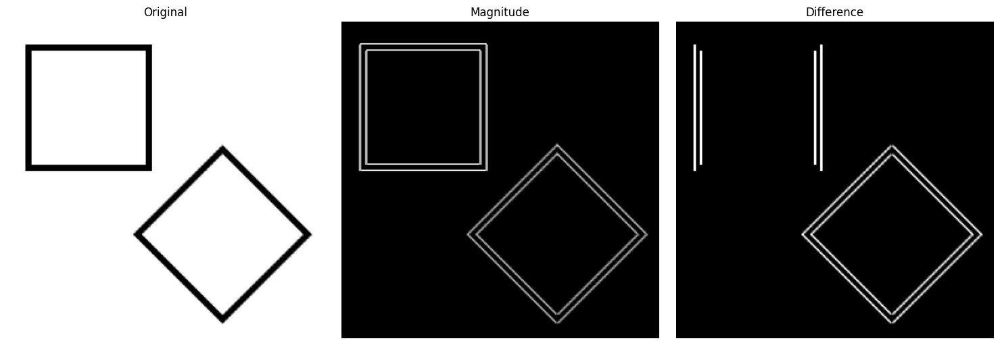

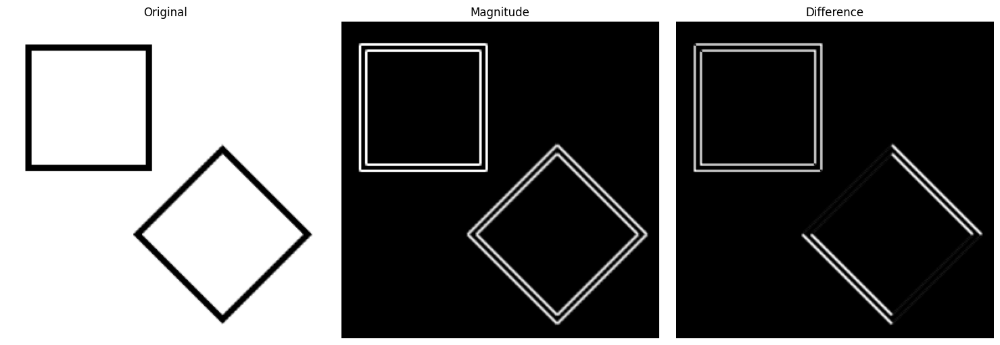

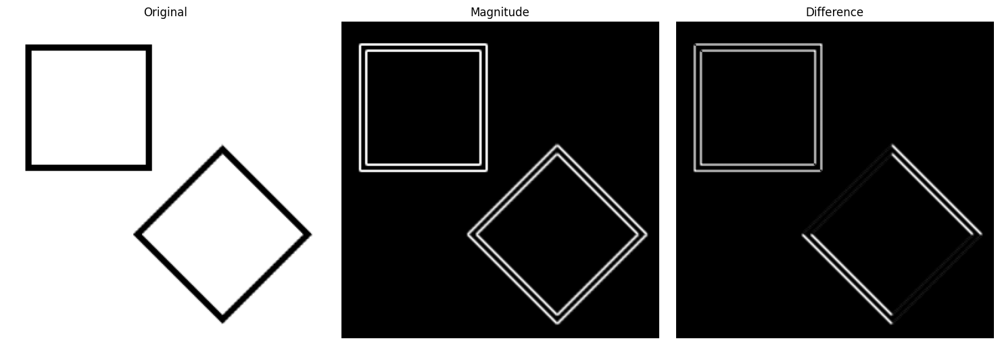

In [24]:
detect_all_edges("kw.png")

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



In [25]:
def sobel_combined_sqrt(img_path):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.float64)
   
   S1 = np.array([[-1, 0, 1],
                  [-2, 0, 2],
                  [-1, 0, 1]])
   S2 = np.array([[-1, -2, -1],
                  [0, 0, 0],
                  [1, 2, 1]])
   
   grad1 = conv_filter(img, S1)
   grad2 = conv_filter(img, S2)
   
   result = np.sqrt(grad1**2 + grad2**2)
   
   plot_three(img, result, np.abs(grad1 - grad2))

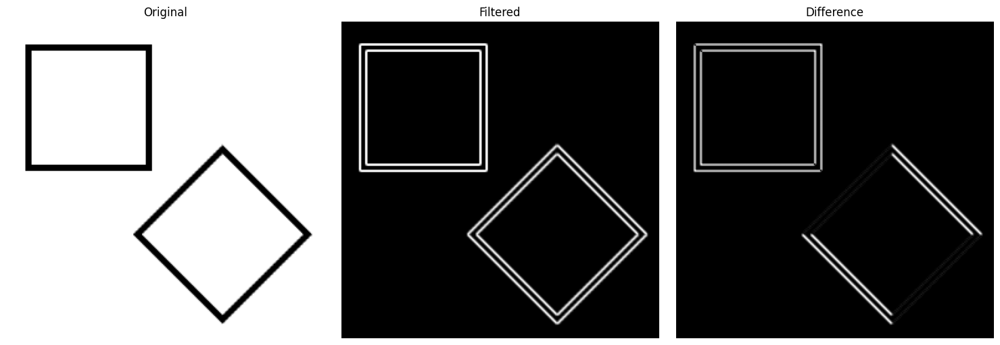

In [26]:
sobel_combined_sqrt("kw.png")

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

In [27]:
def sobel_simplified_sqrt(img_path):
   img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.float64)
   
   S1 = np.array([[-1., 0., 1.],
                  [-2., 0., 2.],
                  [-1., 0., 1.]])
   S2 = np.array([[-1., -2., -1.],
                  [0., 0., 0.],
                  [1., 2., 1.]])
   
   grad1 = conv_filter(img, S1)
   grad2 = conv_filter(img, S2)
   
   result = np.abs(grad1) + np.abs(grad2)
   
   plot_three(img, result, np.abs(grad1 - grad2))

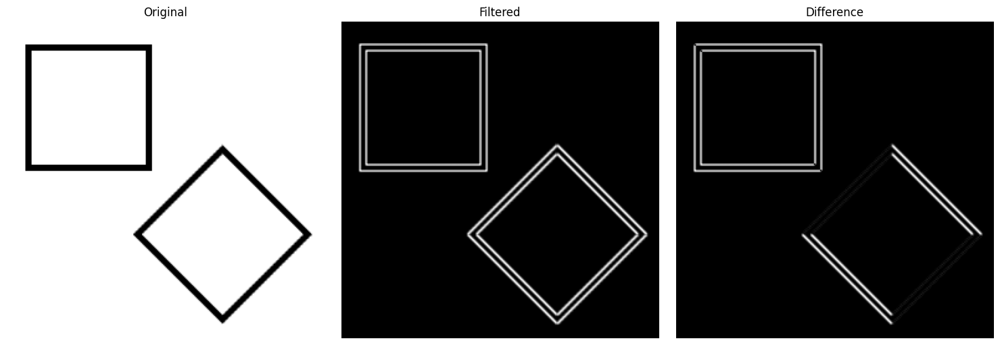

In [28]:
sobel_simplified_sqrt("kw.png")

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

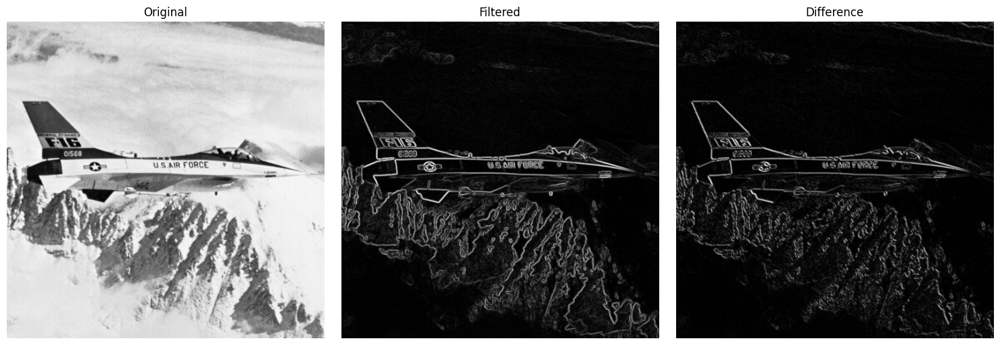

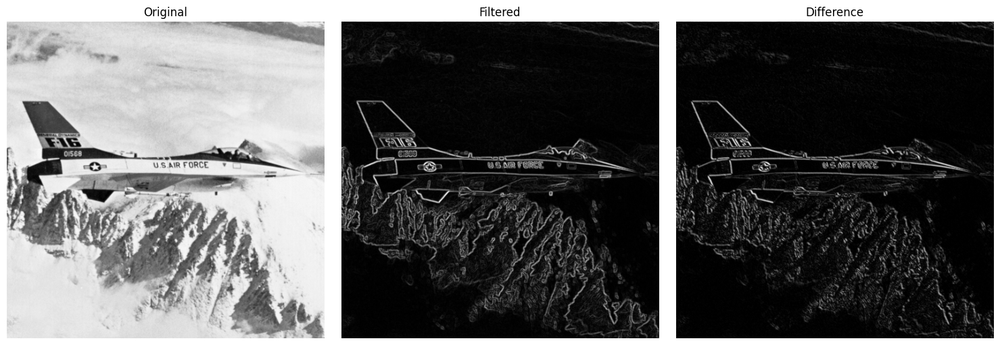

In [29]:

sobel_combined_sqrt("jet.png")
sobel_simplified_sqrt("jet.png")